In [1]:
# plot 20 images from data/img_msk/images, they are in tif format. 

import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random
import rasterio
import geopandas as gpd
from shapely.geometry import shape
import rasterio
from rasterio.features import geometry_mask
import json 

In [2]:


# get the list of images
img_dir = 'data/img_msk/images'
img_list = os.listdir(img_dir)
img_list = [x for x in img_list if x.endswith('.tif')]
img_list.sort()
print(img_list)


['large0.tif', 'large1.tif', 'large10.tif', 'large100.tif', 'large1000.tif', 'large1001.tif', 'large1002.tif', 'large1003.tif', 'large1004.tif', 'large1005.tif', 'large1006.tif', 'large1007.tif', 'large1008.tif', 'large1009.tif', 'large101.tif', 'large1011.tif', 'large1012.tif', 'large1013.tif', 'large1014.tif', 'large1016.tif', 'large1017.tif', 'large1019.tif', 'large102.tif', 'large1021.tif', 'large1022.tif', 'large1023.tif', 'large1024.tif', 'large1025.tif', 'large1027.tif', 'large1028.tif', 'large1029.tif', 'large103.tif', 'large1030.tif', 'large1031.tif', 'large1032.tif', 'large1033.tif', 'large1034.tif', 'large1035.tif', 'large1036.tif', 'large1037.tif', 'large1038.tif', 'large1039.tif', 'large104.tif', 'large1040.tif', 'large1041.tif', 'large1042.tif', 'large1043.tif', 'large1044.tif', 'large1045.tif', 'large1046.tif', 'large1047.tif', 'large1048.tif', 'large1049.tif', 'large105.tif', 'large1050.tif', 'large1051.tif', 'large1052.tif', 'large1053.tif', 'large1054.tif', 'large1055

Among 5033 images, 1199 have a resolution >= 128. 

In [4]:
with open('data/geojson/landfills_openstreetmap.geojson') as f:
    data = json.load(f)

In [5]:
def create_mask(index):
    my_path_to_img = 'data/img_msk/images/large'+str(index)+'.tif'
    with rasterio.open(my_path_to_img) as src:
        epsg = src.crs

        # Polygon in GeoJSON format (in longitude, latitude)
        geojson_polygon = data['features'][index]['geometry']  

        # Convert GeoJSON to Shapely Geometry
        polygon = shape(geojson_polygon)

        # Create a GeoDataFrame with the polygon
        gdf = gpd.GeoDataFrame([1], geometry=[polygon], crs="EPSG:4326")  # Set initial CRS to WGS 84

        # Reproject the GeoDataFrame to match the raster's CRS (EPSG:32633)
        gdf = gdf.to_crs(epsg)

        # Create a mask using the reprojected polygon
        mask = geometry_mask([gdf.geometry[0]], invert=True, transform=src.transform, all_touched=True, out_shape=(src.height, src.width))

        '''img = src.read([1, 2, 3])
        # Adjust image data for display
        img = np.moveaxis(img, 0, -1)
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(img)
        ax[1].imshow(mask, cmap='gray')
        plt.show()
        print(mask)
        #mask is False and True. Turn it ino 0 and 1
        print(mask)'''
        mask = mask.astype(int)
        # save mask_file
        mask_file = 'data/img_msk/masks/mask_' + str(index) + '.tif'
        with rasterio.open(mask_file, 'w', driver='GTiff', height=mask.shape[0], width=mask.shape[1], count=1, dtype=str(mask.dtype), crs=epsg, transform=src.transform) as dst:
            dst.write(mask, 1)


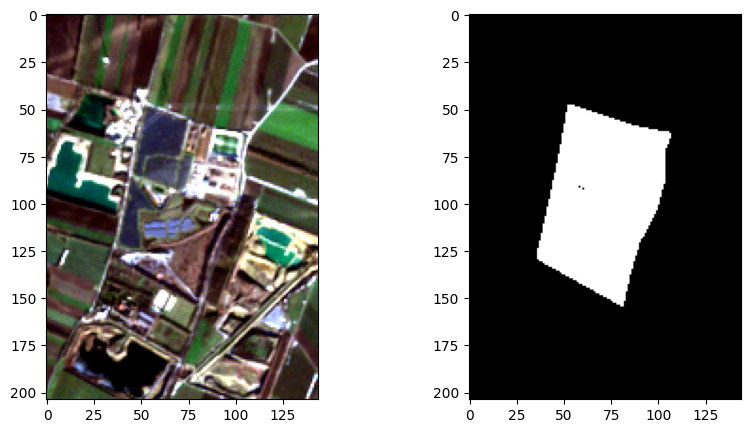

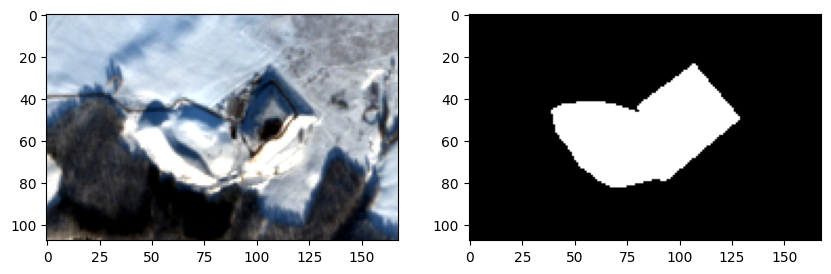

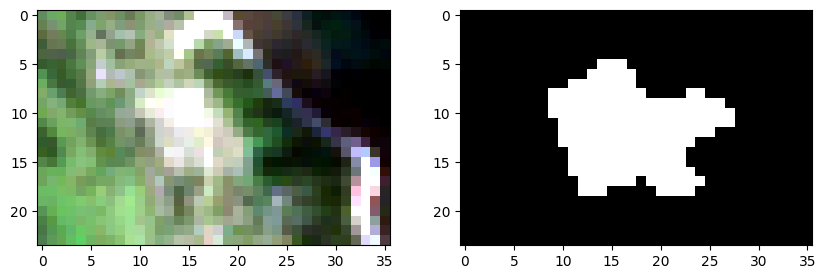

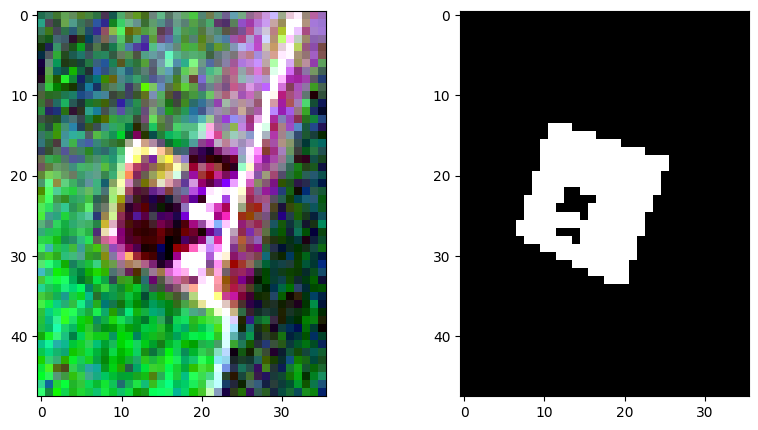

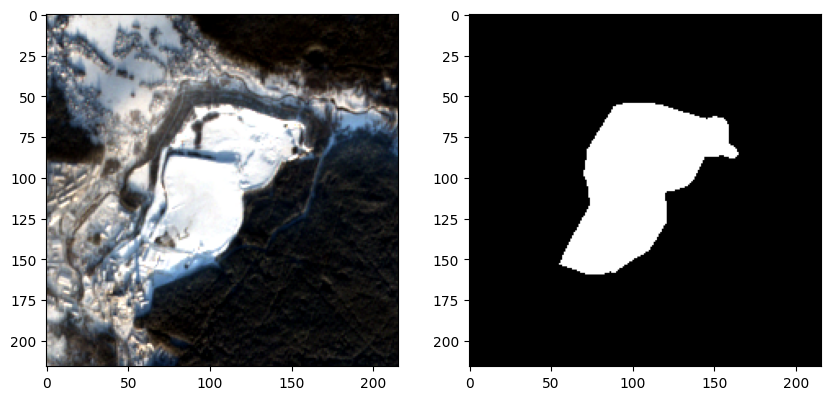

...

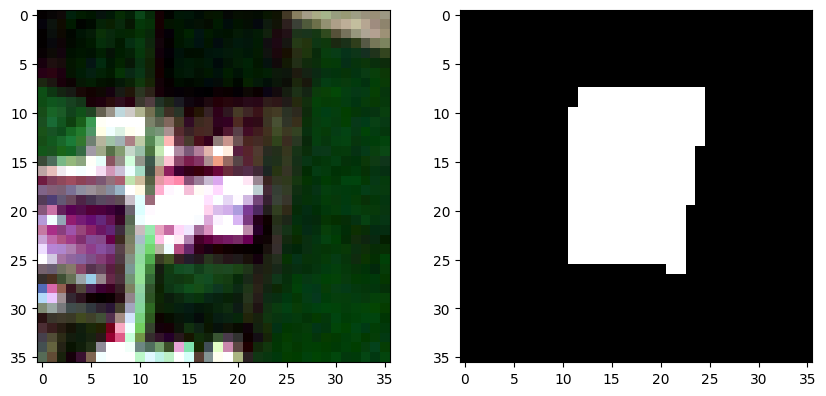

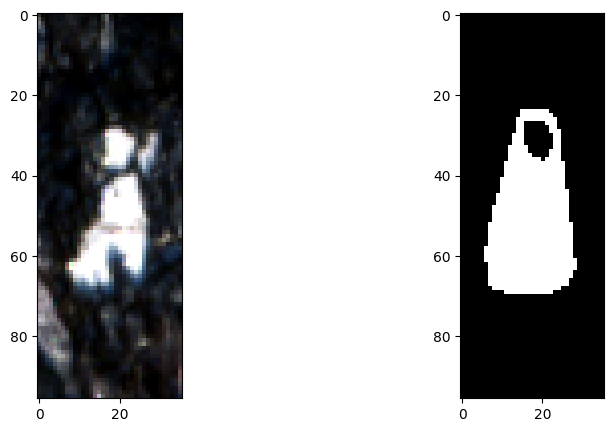

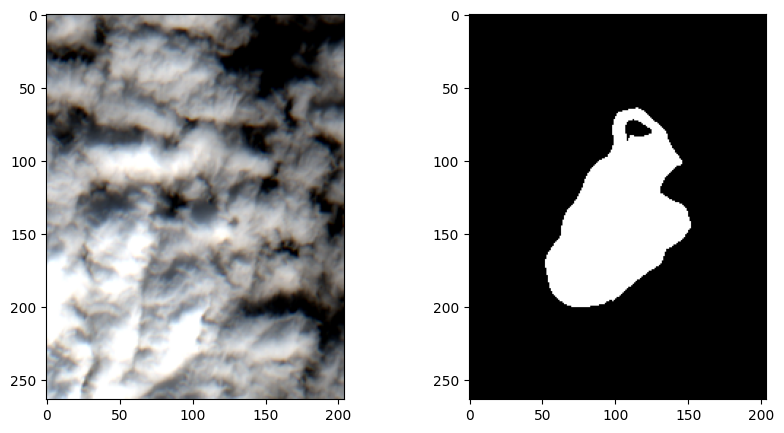

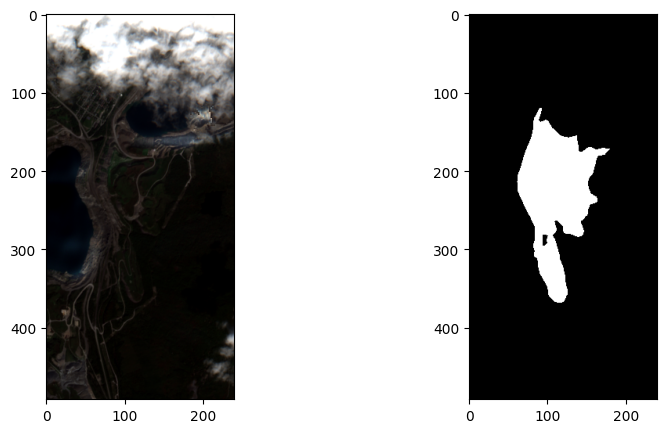

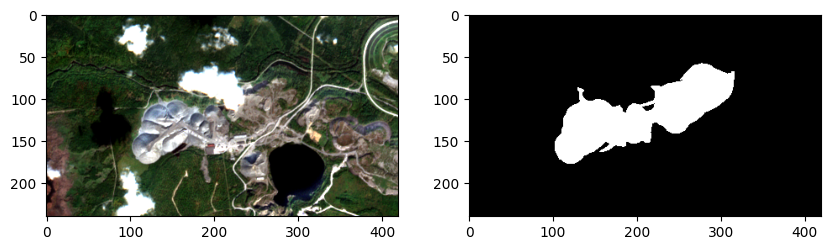

In [28]:
# create masks for the first 20 images
for i in range(20):
    create_mask(i)
    # use rasterio to open image. PLot image and mask side by side
    my_path_to_img = 'data/img_msk/images/large'+str(i)+'.tif'
    with rasterio.open(my_path_to_img) as src:
        img = src.read([1, 2, 3])
        # Adjust image data for display
        img = np.moveaxis(img, 0, -1)
        mask_file = 'data/img_msk/masks/mask_' + str(i) + '.tif'
        with rasterio.open(mask_file) as src:
            mask = src.read()
            mask = mask.astype(int)
            mask = np.moveaxis(mask, 0, -1)
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))
            ax[0].imshow(img)
            ax[1].imshow(mask, cmap='gray')
            plt.show()

In [71]:
# loop on data/img_msk/images and create data/img_msk/images_128_squared
from torchvision import transforms
import torch
import os

# get the list of images
img_dir = 'data/img_msk/images'
img_list = os.listdir(img_dir)
img_list = [x for x in img_list if x.endswith('.tif')]
img_list.sort()
# remove the 'large' and '.tif' at the begin and at the end of file name
img_list = [int(x[5:-4]) for x in img_list]
img_list.sort()

new_size = 128
transform = transforms.Compose([
    transforms.ToPILImage(),  # Convert tensor to PIL image
    transforms.Resize((new_size, new_size)),  # Resize image
    transforms.ToTensor()  # Convert back to tensor
])

# Assuming create_mask is a function defined elsewhere that creates masks for your images

# create directories for images and masks
os.makedirs('data/img_msk/images_128_squared', exist_ok=True)
os.makedirs('data/img_msk/masks_128_squared', exist_ok=True)

# get the list of images
img_dir = 'data/img_msk/images'
img_list = os.listdir(img_dir)
img_list = [x for x in img_list if x.endswith('.tif')]
img_list.sort()
print(img_list)

# remove the large and .tif at the and turn it to int
img_list = [int(x[5:-4]) for x in img_list]
img_list.sort()

# loop on data/img_msk/images and create data/img_msk/images_128_squared
for i in img_list:
    my_path_to_img = 'data/img_msk/images/large'+str(i)+'.tif'
    # open image
    with rasterio.open(my_path_to_img) as src:
        img = src.read()
        # by default loaded as uint16

        # crop in the middle to have a squared image
        large_side = max(img.shape[1], img.shape[2])
        small_side = min(img.shape[1], img.shape[2])
        start = int((large_side - small_side)/2)
        end = start + small_side
        img = img[:, start:end, start:end]
        if img.shape[1] >= 128:
            img = np.moveaxis(img, 0, -1)
            img = img.astype(np.float32) / 255
            img_tensor = transform(img)  # Apply the transformation
            img_np = img_tensor.numpy()  # Example conversion back to original scale
            img = (img_np * 255).astype(np.uint16)
            # save image
            img_file = 'data/img_msk/images_128_squared/img_' + str(i) + '.tif'
            with rasterio.open(img_file, 'w', driver='GTiff', height=img.shape[1], width=img.shape[2], count=3, dtype=str(img.dtype), crs=src.crs, transform=src.transform) as dst:
                dst.write(img)
            
            # create mask   
            create_mask(i)
            mask_file = 'data/img_msk/masks/mask_' + str(i) + '.tif'
            with rasterio.open(mask_file) as src:
                mask = src.read()
                mask = mask.astype(np.uint8)
                mask = transform(mask.transpose(1, 2, 0)) #    
                # transform 0 to 0 and others values to 1
                # multiply each value by 255
                mask = mask * 255
                
                mask_file = 'data/img_msk/masks_128_squared/mask_' + str(i) + '.tif'
                mask = mask.numpy()
                with rasterio.open(mask_file, 'w', driver='GTiff', height=mask.shape[1], width=mask.shape[2], count=1, dtype=str(mask.dtype), crs=src.crs, transform=src.transform) as dst:
                    dst.write(mask)

                '''mask = np.moveaxis(mask, 0, -1)
                fig, ax = plt.subplots(1, 2, figsize=(10, 5))
                img_dis = np.moveaxis(img, 0, -1)
                ax[0].imshow(img_dis)
                ax[1].imshow(mask, cmap='gray')
                plt.show()'''



['large0.tif', 'large1.tif', 'large10.tif', 'large100.tif', 'large1000.tif', 'large1001.tif', 'large1002.tif', 'large1003.tif', 'large1004.tif', 'large1005.tif', 'large1006.tif', 'large1007.tif', 'large1008.tif', 'large1009.tif', 'large101.tif', 'large1011.tif', 'large1012.tif', 'large1013.tif', 'large1014.tif', 'large1016.tif', 'large1017.tif', 'large1019.tif', 'large102.tif', 'large1021.tif', 'large1022.tif', 'large1023.tif', 'large1024.tif', 'large1025.tif', 'large1027.tif', 'large1028.tif', 'large1029.tif', 'large103.tif', 'large1030.tif', 'large1031.tif', 'large1032.tif', 'large1033.tif', 'large1034.tif', 'large1035.tif', 'large1036.tif', 'large1037.tif', 'large1038.tif', 'large1039.tif', 'large104.tif', 'large1040.tif', 'large1041.tif', 'large1042.tif', 'large1043.tif', 'large1044.tif', 'large1045.tif', 'large1046.tif', 'large1047.tif', 'large1048.tif', 'large1049.tif', 'large105.tif', 'large1050.tif', 'large1051.tif', 'large1052.tif', 'large1053.tif', 'large1054.tif', 'large1055

['img_0.tif', 'img_1003.tif', 'img_101.tif', 'img_102.tif', 'img_103.tif', 'img_1036.tif', 'img_1038.tif', 'img_104.tif', 'img_1050.tif', 'img_1051.tif', 'img_106.tif', 'img_1064.tif', 'img_108.tif', 'img_1087.tif', 'img_1093.tif', 'img_1110.tif', 'img_1126.tif', 'img_1128.tif', 'img_1129.tif', 'img_1130.tif', 'img_1141.tif', 'img_1145.tif', 'img_1147.tif', 'img_1148.tif', 'img_1156.tif', 'img_1157.tif', 'img_1158.tif', 'img_1168.tif', 'img_1171.tif', 'img_1173.tif', 'img_1177.tif', 'img_1186.tif', 'img_1191.tif', 'img_1217.tif', 'img_1229.tif', 'img_1242.tif', 'img_1248.tif', 'img_1249.tif', 'img_1252.tif', 'img_1256.tif', 'img_1257.tif', 'img_1270.tif', 'img_1271.tif', 'img_1288.tif', 'img_1295.tif', 'img_1299.tif', 'img_130.tif', 'img_1301.tif', 'img_1303.tif', 'img_1307.tif', 'img_131.tif', 'img_1315.tif', 'img_1318.tif', 'img_1323.tif', 'img_1337.tif', 'img_1339.tif', 'img_1340.tif', 'img_1341.tif', 'img_1344.tif', 'img_1345.tif', 'img_1346.tif', 'img_1348.tif', 'img_1350.tif', 'i

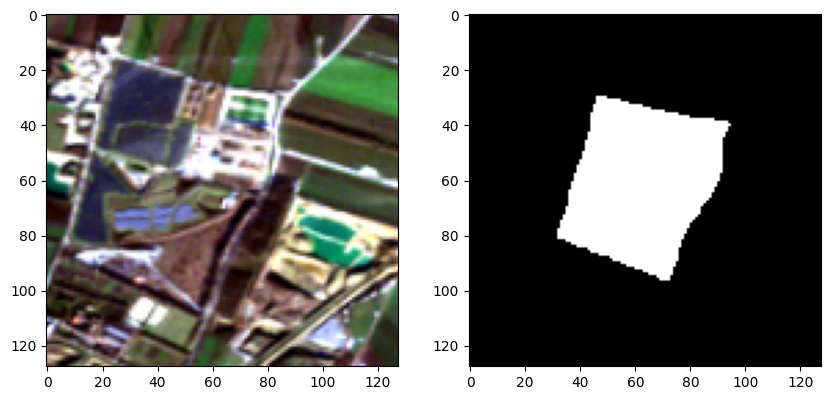

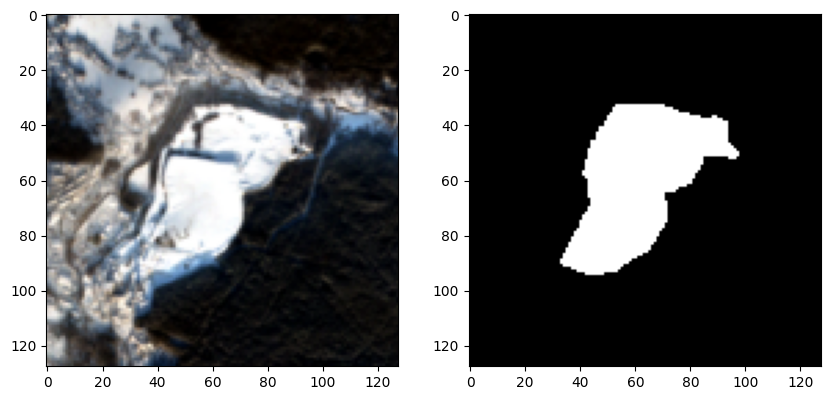

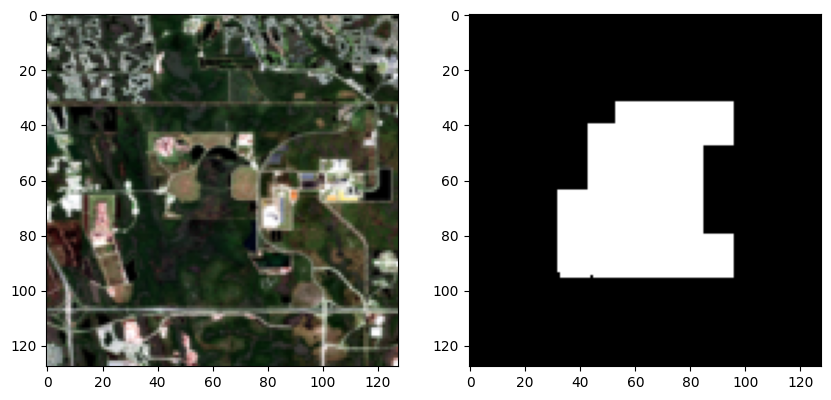

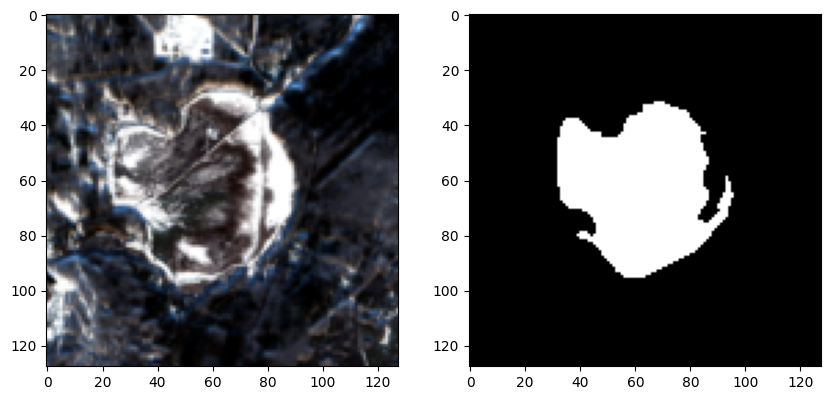

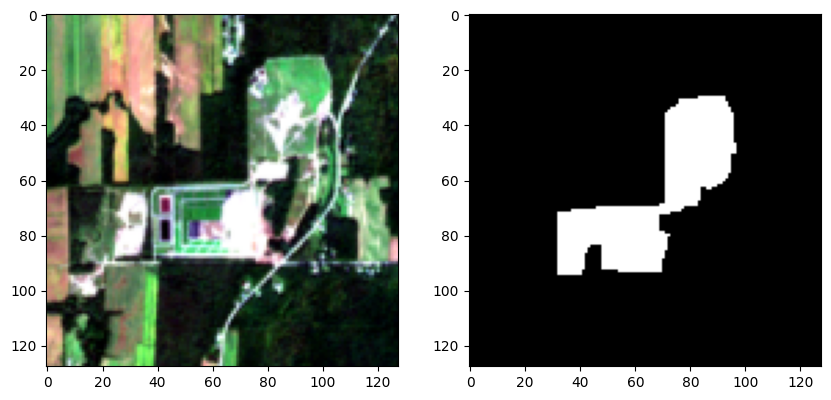

...

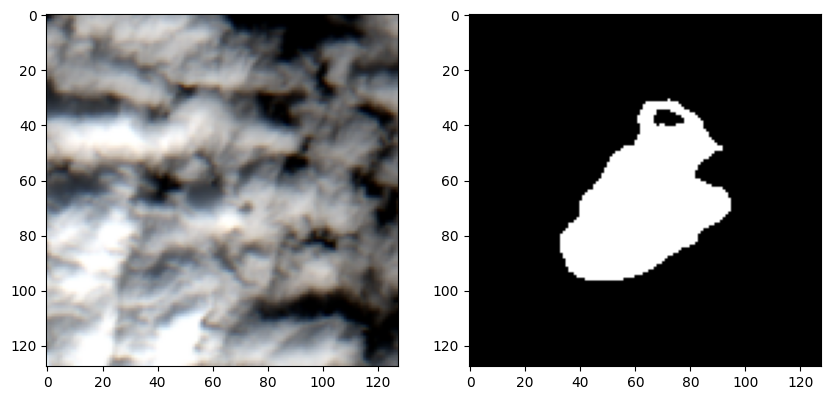

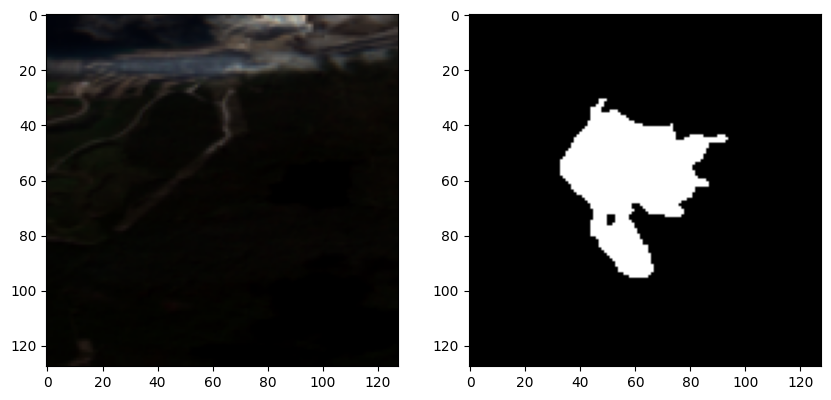

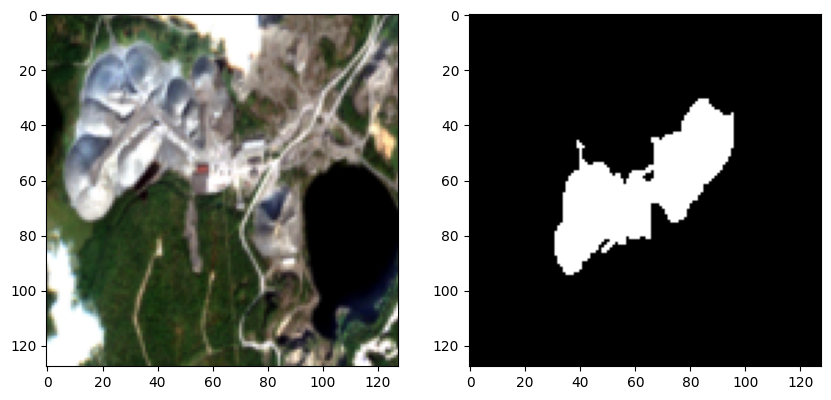

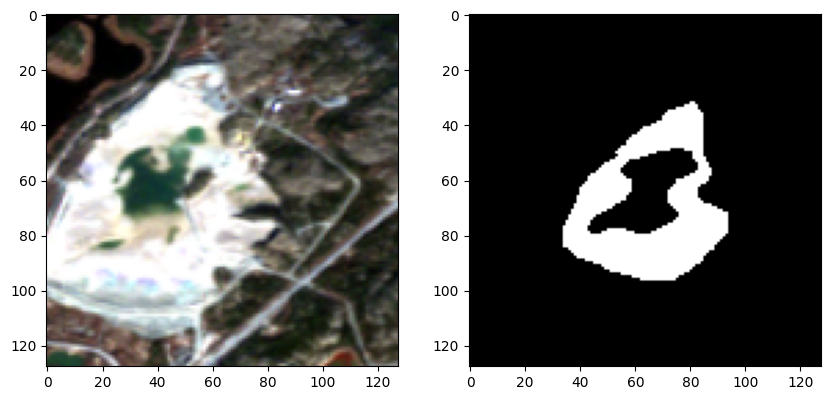

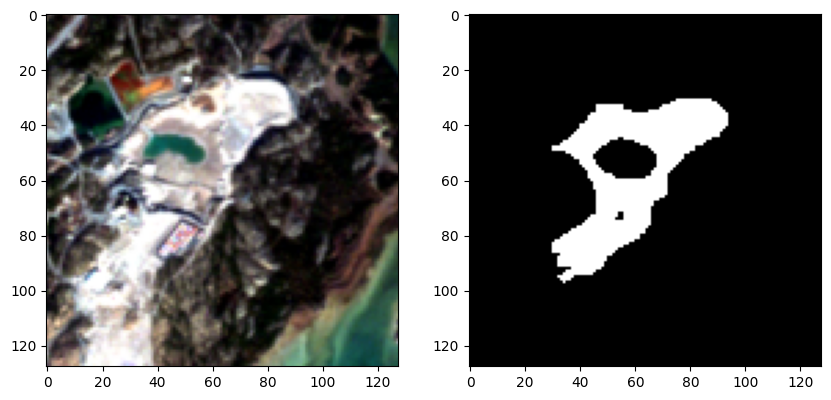

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f2d1981c5e0>>
Traceback (most recent call last):
  File "/home/bertille/miniconda3/envs/env_rs/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


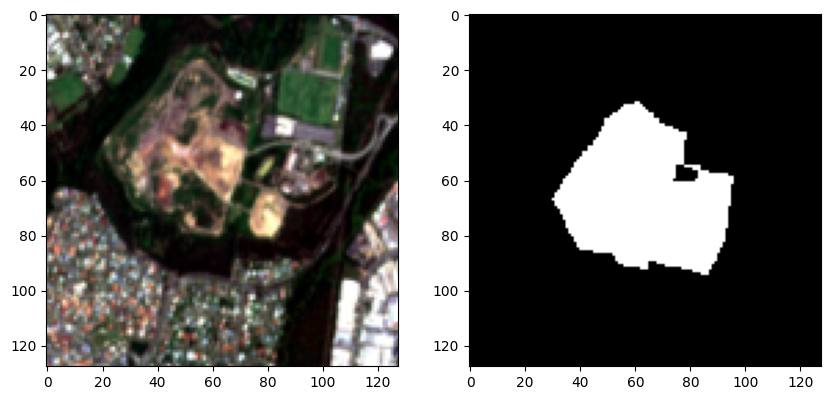

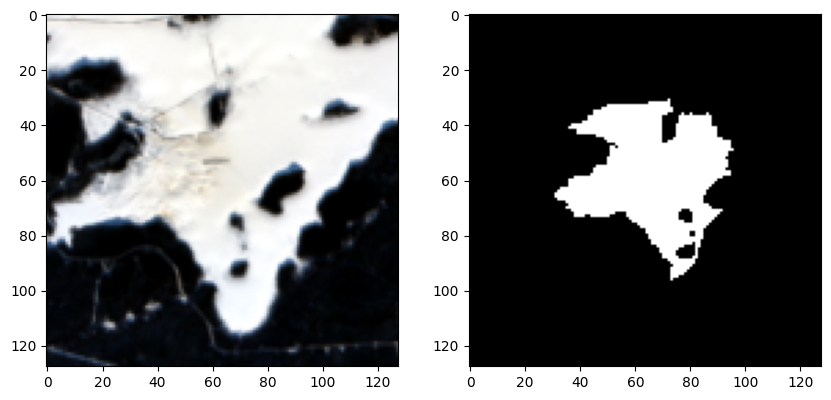

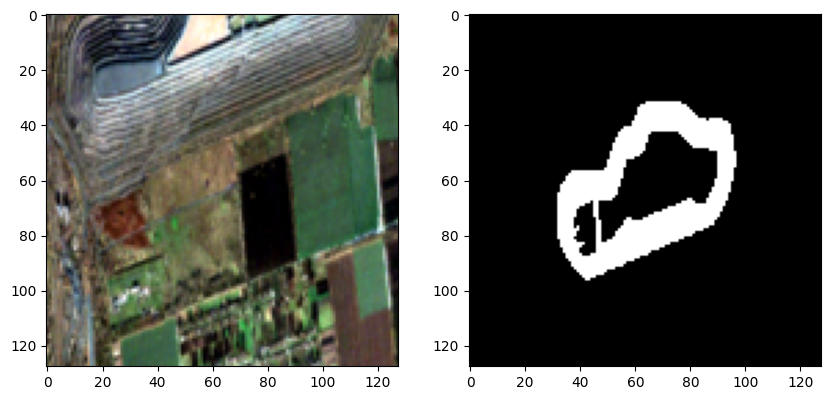

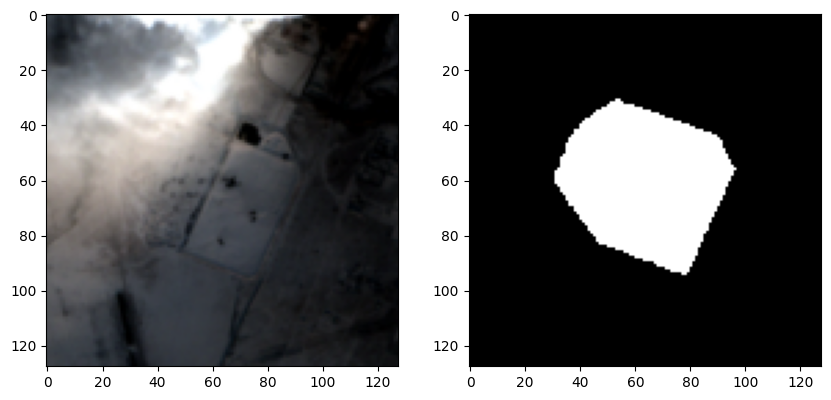

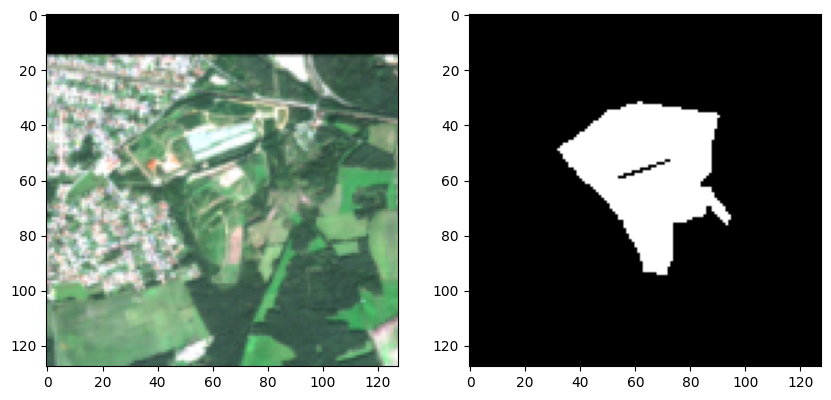

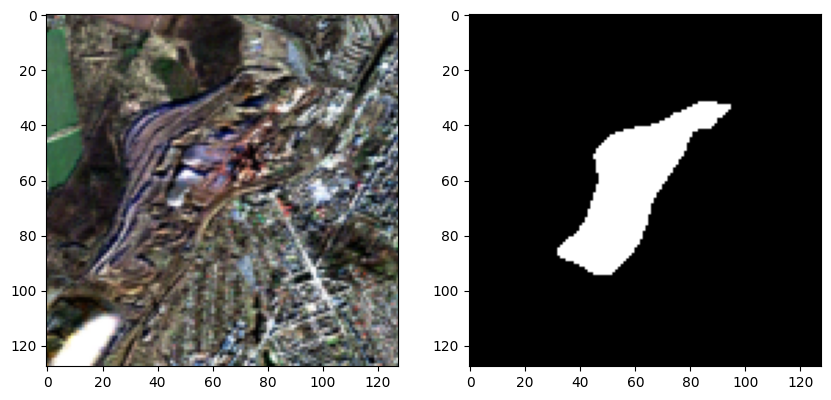

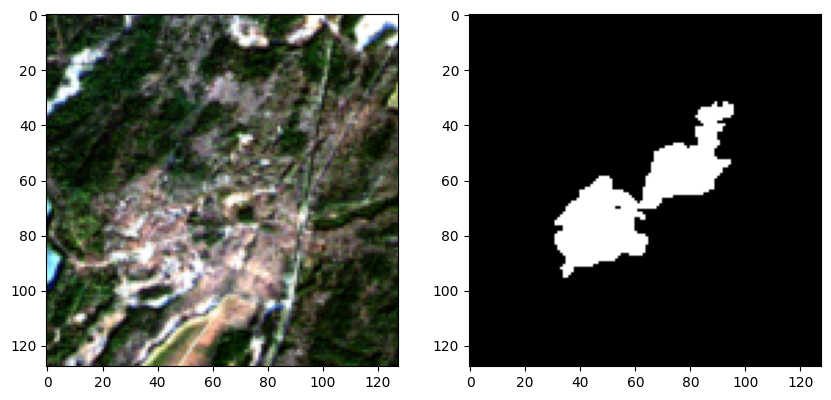

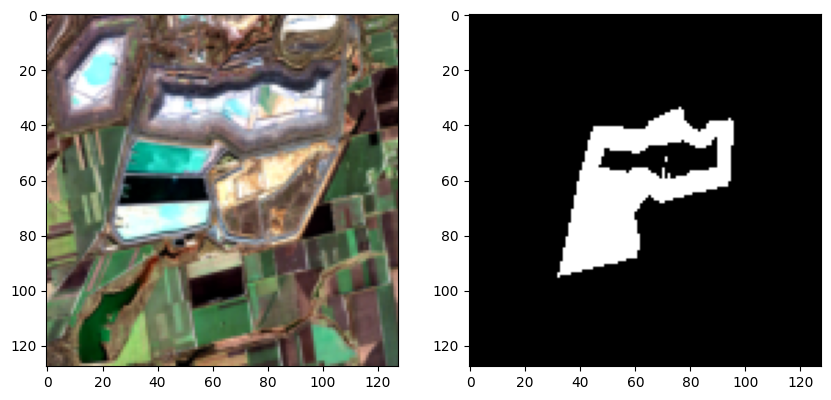

In [4]:
# plot image and mask from data/img_msk/images_128_squared and data/img_msk/masks_128_squared sid eby side
# create masks for the first 20 images
# get the list of images
img_dir = 'data/img_msk/images_128_squared'
img_list = os.listdir(img_dir)
img_list = [x for x in img_list if x.endswith('.tif')]
img_list.sort()
print(img_list)

# remove the img_ and .tif at the and turn it to int
img_list = [int(x[4:-4]) for x in img_list]
img_list.sort()

for i in img_list[0:20]:
    # use rasterio to open image. PLot image and mask side by side
    my_path_to_img = 'data/img_msk/images_128_squared/img_'+str(i)+'.tif'
    with rasterio.open(my_path_to_img) as src:
        img = src.read([1, 2, 3])
        # Adjust image data for display
        img = np.moveaxis(img, 0, -1)
        mask_file = 'data/img_msk/masks_128_squared/mask_' + str(i) + '.tif'
        with rasterio.open(mask_file) as src:
            mask = src.read()
            mask = mask.astype(int)
            mask = np.moveaxis(mask, 0, -1)
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))
            ax[0].imshow(img)
            ax[1].imshow(mask, cmap='gray')
            plt.show()
            #plot mask on top of image
            plt.